<a href="https://colab.research.google.com/github/Juanhernandez1972/Diabetes_Health/blob/main/Diabetes_Health.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Entrega 2 Proyecto (Diabetes)

Integrantes.


*   Juan Felipe Hernandez
*   Manuel Enrique Luna
*   Dallys Nicol Sinisterra Gutierrez


**Indicadores de salud de la diabetes**

El conjunto de datos de Indicadores de Salud de la Diabetes contiene estadísticas sobre la salud y el estilo de vida de las personas en general, junto con su diagnóstico de diabetes. Las características incluyen datos demográficos, resultados de análisis de laboratorio y respuestas a preguntas de la encuesta para cada paciente. La variable objetivo para la clasificación es determinar si el paciente tiene diabetes, es prediabético o está sano.

En el siguiente notebook se presentará la exploración inicial del conjunto de datos, revisando aspectos clave como valores nulos, valores atípicos, tipos de variables y, por último, el análisis exploratorio de datos (EDA) del conjunto de datos. Lo anterior con el fin de conocer a mayor detalle el conjunto de datos, qué información nos puede ofrecer y cómo se relacionan las demás variables con la variable objetivo

secciones del notebook

- Importación de librerias.
- Carga del conjunto de datos.
- Análisis de datos nulos.
- Análisis de valores atípicos.
- Análisis exploratorio de datos (EDA)

# Información del conjunto de datos

diabetes_binary_5050split_health_indicators_BRFSS2015.csv es un conjunto de datos limpio con 70.692 respuestas a la encuesta BRFSS2015 de los CDC. Está dividido equitativamente entre encuestados sin diabetes y con prediabetes o diabetes. La variable objetivo Diabetes_binary tiene dos clases: 0 para la ausencia de diabetes y 1 para la prediabetes o diabetes. Este conjunto de datos tiene 22 variables características y está equilibrado.

¿Con qué propósito se creó el conjunto de datos?


*   Para comprender mejor la relación entre el estilo de vida y la diabetes en EE.UU.

¿Qué representan las instancias de este conjunto de datos?


*   Cada fila representa a una persona que participa en este estudio.


¿Contiene el conjunto de datos datos que puedan considerarse sensibles?

- Género
- Ingresos
- Nivel educativo

¿Se realizó algún preprocesamiento de datos?


*   Clasificación por edad

¿Contiene valores faltantes?


*   No


# Importación de librerias.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import plotly.figure_factory as ff

# Carga del conjunto de datos.

In [ ]:
from google.colab import drive
df = pd.read_csv("/content/diabetes_binary_5050split_health_indicators_BRFSS2015.csv")

Explicación de las variables y sus valores

Age: Rango de edad de los encuestados.
- 1: Personas entre 18 y 24 años
- 2: Personas entre 25 y 29 años
- 3: Personas entre 30 y 34 años
- 4: Personas entre 35 y 39 años
- 5: Personas entre 40 y 44 años
- 6: Personas entre 45 y 49 años
- 7: Personas entre 50 y 54 años
- 8: Personas entre 55 y 59 años
- 9: Personas entre 60 y 64 años
- 10: Personas entre 65 y 69 años
- 11: Personas entre 70 y 74 años
- 12: Personas entre 75 y 79 años
- 13: Personas de 80 años o más

Diabetes_binary: Indica si la persona tiene diabetes o no.
- 0: No tiene diabetes
- 1: Tiene diabetes

HighBP: Indica si se ha diagnosticado presión arterial alta.
- 0: No tiene presión alta
- 1: Tiene presión alta

HighChol: Indica si la persona tiene niveles altos de colesterol.
- 0: No tiene colesterol alto
- 1: Tiene colesterol alto

CholCheck: Indica si la persona se ha hecho un chequeo de colesterol en los últimos 5 años.
- 0: No se ha hecho chequeo de colesterol en los últimos 5 años
- 1: Sí se ha hecho chequeo de colesterol en los últimos 5 años

Smoker: Indica si la persona fuma cigarrillos.
- 0: No fuma
- 1: Sí fuma

BMI : Índice de masa corporal

MentHlth : Ahora, pensando en su salud mental, que incluye estrés, depresión y problemas emocionales, ¿cuántos días durante los últimos 30 días su salud mental no fue buena? Escala 1-30 días

PhysHlth : Ahora, pensando en su salud física, que incluye enfermedades y lesiones, ¿cuántos días durante los últimos 30 días no fue buena su salud física? Escala 1-30 días

Stroke: Indica si la persona ha sufrido un derrame cerebral.
- 0: No ha tenido derrame cerebral
- 1: Sí ha tenido derrame cerebral

HeartDiseaseorAttack: Indica si ha tenido enfermedad del corazón o infarto.
- 0: No ha tenido enfermedad del corazón ni infarto
- 1: Sí ha tenido enfermedad del corazón o infarto

PhysActivity: Indica si la persona realiza actividad física.
- 0: No realiza actividad física
- 1: Sí realiza actividad física

Fruits: Indica si consume frutas regularmente.
- 0: No consume frutas
- 1: Sí consume frutas

Veggies: Indica si consume vegetales regularmente.
- 0: No consume vegetales
- 1: Sí consume vegetales

HvyAlcoholConsump: Indica si hay consumo excesivo de alcohol.
- 0: No consume alcohol en exceso
- 1: Sí consume alcohol en exceso

AnyHealthcare: Indica si tiene algún tipo de cobertura o acceso a servicios de salud.
- 0: No tiene acceso a atención médica
- 1: Sí tiene acceso a atención médica

NoDocbcCost: Indica si alguna vez no pudo ver a un médico por razones económicas.
- 0: Nunca ha dejado de ver un médico por falta de dinero
- 1: Sí ha dejado de ver un médico por falta de dinero

GenHlth: Representa la percepción general de salud de la persona.
- 5: Excelente salud
- 4: Muy buena salud
- 3: Buena salud
- 2: Salud regular
- 1: Mala salud

DiffWalk: Indica si tiene dificultad para caminar o subir escaleras.
- 0: No tiene dificultad para caminar
- 1: Sí tiene dificultad para caminar

Sex: Representa el sexo de la persona.
- 0: Mujer
- 1: Hombre

Education: Indica el nivel educativo alcanzado.
- 1: Nunca asistió a la escuela
- 2: Educación primaria
- 3: Educación secundaria básica
- 4: Educación secundaria completa
- 5: Título de pregrado
- 6: Título de maestría

Income: Clasifica el ingreso familiar en tres grandes grupos.
- 1, 2, 3, 4: Menos de $10,000 dólares al año
- 5, 6, 7: Menos de $35,000 dólares al año
- 8: $75,000 dólares o más al año

In [ ]:
# Mostrar todas las columnas
pd.set_option('display.max_columns', None)
df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,1.0,0.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,6.0,4.0,1.0
70688,1.0,0.0,1.0,1.0,29.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,1.0,1.0,10.0,3.0,6.0
70689,1.0,1.0,1.0,1.0,25.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,5.0,15.0,0.0,1.0,0.0,13.0,6.0,4.0
70690,1.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0


In [ ]:
df.shape

(70692, 22)

In [ ]:
# Nombres de las columnas
df.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [ ]:
# Tipos de datos.
df.dtypes

,0
Diabetes_binary,float64
HighBP,float64
HighChol,float64
CholCheck,float64
BMI,float64
Smoker,float64
Stroke,float64
HeartDiseaseorAttack,float64
PhysActivity,float64
Fruits,float64


Podemos observar que todas las columnas son del tipo float64, lo que indica que todos los datos son numéricos.

In [ ]:
# Lista de columnas a excluir
exclude = [
    'Diabetes_binary','HighBP','HighChol','CholCheck','Smoker', 'Stroke',
    'HeartDiseaseorAttack','PhysActivity','Fruits','Veggies',
    'HvyAlcoholConsump','AnyHealthcare','NoDocbcCost','GenHlth',
    'MentHlth','DiffWalk','Sex','Education'
]

df[[col for col in df.columns if col not in exclude]].describe()


,BMI,PhysHlth,Age,Income
count,70692.000000,70692.000000,70692.000000,70692.000000
mean,29.856985,5.810417,8.584055,5.698311
std,7.113954,10.062261,2.852153,2.175196
min,12.000000,0.000000,1.000000,1.000000
25%,25.000000,0.000000,7.000000,4.000000
50%,29.000000,0.000000,9.000000,6.000000
75%,33.000000,6.000000,11.000000,8.000000
max,98.000000,30.000000,13.000000,8.000000


In [ ]:
#resumen estadístico
# Aplico describe() a todo y luego quito las columnas que no quiero ver
df.describe().drop(columns=exclude, errors='ignore')

,BMI,PhysHlth,Age,Income
count,70692.000000,70692.000000,70692.000000,70692.000000
mean,29.856985,5.810417,8.584055,5.698311
std,7.113954,10.062261,2.852153,2.175196
min,12.000000,0.000000,1.000000,1.000000
25%,25.000000,0.000000,7.000000,4.000000
50%,29.000000,0.000000,9.000000,6.000000
75%,33.000000,6.000000,11.000000,8.000000
max,98.000000,30.000000,13.000000,8.000000


El resumen estadístico nos permite observar las principales medidas estadísticas, como la media, la desviación estándar y los cuartiles. Asimismo, nos brinda una idea de los posibles valores atípicos y nulos que se puedan presentar, aunque estos dos aspectos los analizaremos con más detenimiento más adelante.

# Análisis de datos nulos.

In [ ]:
#Conteo de datos nulos.
df.isnull().sum()

,0
Diabetes_binary,0
HighBP,0
HighChol,0
CholCheck,0
BMI,0
Smoker,0
Stroke,0
HeartDiseaseorAttack,0
PhysActivity,0
Fruits,0


Se pueden observar que no existen valores nulos en el conjunto de datos.

# Análisis de valores atípicos.

In [ ]:
 # Mostrar los valores atípicos en cada columna utilizando la técnica IQR
print("valores atípicos en cada columna")
outliers = {}
for column in df.select_dtypes(include=["number"]).columns:
  q1 = df[column].quantile(0.25)
  q3 = df[column].quantile(0.75)
  iqr = q3 - q1
  lower_bound = q1 - 1.5 * iqr
  upper_bound = q3 + 1.5 * iqr
  outliers[column] = df[(df[column] < lower_bound) | (df[column] > upper_bound)].shape[0]
display(outliers)
print(".....")
print("\n")

valores atípicos en cada columna


{'Diabetes_binary': 0,
 'HighBP': 0,
 'HighChol': 0,
 'CholCheck': 1749,
 'BMI': 2181,
 'Smoker': 0,
 'Stroke': 4395,
 'HeartDiseaseorAttack': 10449,
 'PhysActivity': 0,
 'Fruits': 0,
 'Veggies': 14932,
 'HvyAlcoholConsump': 3020,
 'AnyHealthcare': 3184,
 'NoDocbcCost': 6639,
 'GenHlth': 0,
 'MentHlth': 11816,
 'PhysHlth': 10624,
 'DiffWalk': 0,
 'Sex': 0,
 'Age': 0,
 'Education': 0,
 'Income': 0}

.....




En un primer análisis de los datos, se puede decir que presentan valores atípicos utilizando la técnica IQR. Sin embargo, deben ser analizados más detenidamente para determinar si realmente son atípicos o no.

In [ ]:
# Variables a graficar
columns = ['BMI', 'GenHlth', 'MentHlth', 'PhysHlth', 'Age', 'Education', 'Income']

# Crear subgráficos
fig = sp.make_subplots(
    rows=4, cols=2,  # 4 filas y 2 columnas
    subplot_titles=columns,  # Títulos de los subgráficos
    vertical_spacing=0.15  # Espacio entre subgráficos
)

# Añadir boxplots
for i, col in enumerate(columns):
    row = i // 2 + 1  # Calcular la fila
    col_pos = i % 2 + 1  # Calcular la columna
    fig.add_trace(
        px.box(df, x=col).data[0],  # Añadir el boxplot para cada variable
        row=row, col=col_pos
    )

# Actualizar el diseño
fig.update_layout(
    height=1000,  # Altura total del gráfico
    width=800,    # Ancho total del gráfico
    title_text="Distribución de Variables por Caja",
    showlegend=False
)

fig.show()

Podemos observar en los boxplots que aparentemente hay datos atípicos; sin embargo, al revisar la escala normal de las variables, se evidencia que estos valores se encuentran dentro de los rangos esperados según la metadata.

In [ ]:
two_unique_values = []
more_than_two_values = []

for col in df.columns:
    unique_vals = df[col].unique()
    num_unique_vals = len(unique_vals)

    if num_unique_vals == 2:
        #columns with exactly 2 unique values
        two_unique_values.append({
            "Nombre de la columna": col,
            "Primer valor": unique_vals[0],
            "Segundo valor": unique_vals[1]
        })
    elif num_unique_vals > 2:
        #columns with more than 2 unique values
        more_than_two_values.append({
            "Nombre de la columna": col,
            "Numero de valores unicos": num_unique_vals
        })

df_two_unique = pd.DataFrame(two_unique_values)
df_more_than_two = pd.DataFrame(more_than_two_values)

print("Columnas que tienen exactamente 2 valores únicos:")
df_two_unique

Columnas que tienen exactamente 2 valores únicos:


,Nombre de la columna,Primer valor,Segundo valor
0,Diabetes_binary,0.0,1.0
1,HighBP,1.0,0.0
2,HighChol,0.0,1.0
3,CholCheck,1.0,0.0
4,Smoker,0.0,1.0
5,Stroke,0.0,1.0
6,HeartDiseaseorAttack,0.0,1.0
7,PhysActivity,1.0,0.0
8,Fruits,0.0,1.0
9,Veggies,1.0,0.0


In [ ]:
print("\nColumnas que tienen más de 2 valores únicos y sus recuentos:")
df_more_than_two


Columnas que tienen más de 2 valores únicos y sus recuentos:


,Nombre de la columna,Numero de valores unicos
0,BMI,80
1,GenHlth,5
2,MentHlth,31
3,PhysHlth,31
4,Age,13
5,Education,6
6,Income,8


# Análisis exploratorio de datos (EDA)

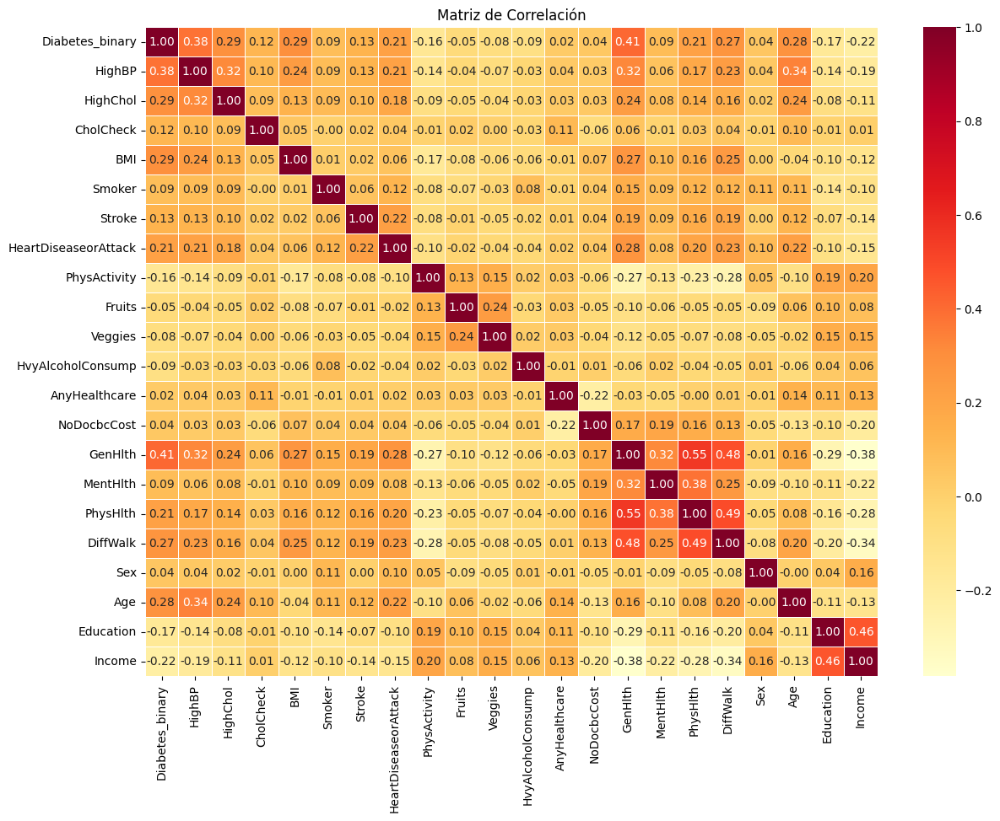

In [ ]:
# Calcular la matriz de correlación
correlation_matrix = df.corr()

# Crear el mapa de calor
plt.figure(figsize=(14, 10))  # Puedes ajustar el tamaño
sns.heatmap(correlation_matrix, annot=True, cmap='YlOrRd', fmt=".2f", linewidths=0.5,annot_kws={"size": 10})
plt.title("Matriz de Correlación")
plt.show()

En la matriz de correlación podemos observar las relaciones entre las variables. Se evidencia que, en general, las correlaciones no son muy fuertes; sin embargo, destacan las variables GenHlth, BMI, HighChol y HighBP, las cuales presentan correlaciones positivas con la variable objetivo.

In [ ]:
# Histogramas de las diferentes variables.
# Seleccionar variables numéricas
cols = df.select_dtypes(include='number').columns
# Configurar número de columnas y calcular filas necesarias
num_cols = 3
num_rows = math.ceil(len(cols) / num_cols)
# Crear subplots
fig = make_subplots(
    rows=num_rows,
    cols=num_cols,
    subplot_titles=cols
)
# Añadir histogramas a la figura
for i, col in enumerate(cols):
    row = i // num_cols + 1
    col_pos = i % num_cols + 1
    fig.add_trace(
        go.Histogram(x=df[col], name=col, nbinsx=40,marker_color='#fd8d3c'),
        row=row, col=col_pos
    )
# Ajustar layout
fig.update_layout(
    height=300 * num_rows,
    width=1000,
    title_text="Histogramas por variable numérica",
    showlegend=False
)
fig.show()

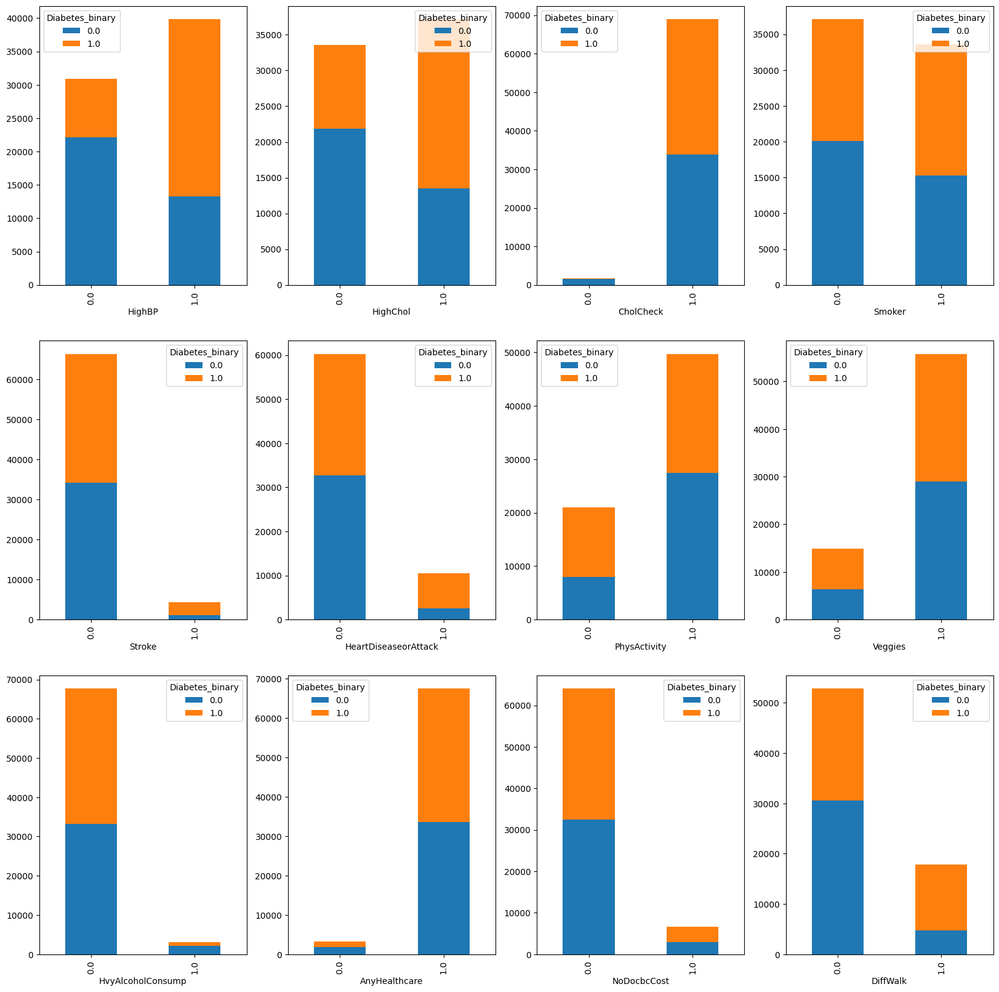

In [ ]:
# Visualización de columnas [Sí - NO] y su relación con el objetivo

cols = ['HighBP', 'HighChol', 'CholCheck','Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk']

def create_plot_pivot(df, x_column):
    """ Cree una tabla dinámica de satisfacción versus otra calificación para facilitar la representación gráfica.. """
    _df_plot = df.groupby([x_column, 'Diabetes_binary']).size() \
    .reset_index().pivot(columns='Diabetes_binary', index=x_column, values=0)
    return _df_plot

fig, ax = plt.subplots(3, 4, figsize=(20,20))
axe = ax.ravel()

c = len(cols)

for i in range(c):
    create_plot_pivot(df, cols[i]).plot(kind='bar',stacked=True, ax=axe[i])
    axe[i].set_xlabel(cols[i])

fig.show()

Podemos observar todas las variables de tipo binomial y su relación con la variable objetivo.

In [ ]:
# Distribución de Edad según Diabetes
fig = px.box(
    df,
    x="Diabetes_binary",
    y="Age",
    color="Diabetes_binary",  # Opcional: para colorear por categoría
    color_discrete_sequence=["#fd8d3c"],  # Naranja
    title="Distribución de Edad según Diabetes"
)

fig.update_layout(
    xaxis_title="Diabetes (0 = No, 1 = Sí)",
    yaxis_title="Edad"
)

fig.show()

En el gráfico podemos observar que la diabetes se presenta con mayor frecuencia en los grupos de edad más avanzada. También se evidencian algunos casos en edades más tempranas; si bien esto es posible, es poco frecuente.

In [ ]:
# Calcular la tabla de contingencia
crosstab = pd.crosstab(df['Age'], df['Diabetes_binary'])

# Convertir la tabla de contingencia a formato largo (long format)
crosstab_long = crosstab.reset_index().melt(id_vars='Age', value_vars=[0, 1], var_name='Diabetes_binary', value_name='Frequency')

# Crear gráfico de barras
fig = px.bar(
    crosstab_long,
    x='Age',
    y='Frequency',
    color='Diabetes_binary',
    title='Diabetes Disease Frequency for Ages',
    labels={'Age': 'Age', 'Frequency': 'Frequency'},
    barmode='group'
)

# Ajustar la visualización
fig.update_layout(
    xaxis_title='Age',
    yaxis_title='Frequency',
    xaxis_tickangle=0,  # Para que las etiquetas del eje X no se roten
)

fig.show()

En el gráfico de frecuencias se refuerza la afirmación de que la diabetes se presenta con mayor frecuencia en los grupos de edad más avanzados, mientras que en los grupos más jóvenes es menos común.

In [ ]:
fig = px.histogram(
    data_frame=df,
    x="Income",
    color="Diabetes_binary",
    barmode="group",
    color_discrete_map={
        0: "mediumaquamarine",
        1: "#fd8d3c"
    },
    title="Income vs Diabetes Binary"
)

fig.update_layout(
    xaxis_title="Income",
    yaxis_title="Count",
    title_font_size=16,
    legend_title="Diabetes Binary",
    xaxis_tickangle=45
)

fig.show()

En el gráfico 'Income vs Diabetes Binary' se observa que, en los grupos de ingresos más altos, la proporción de personas sin diagnóstico de diabetes o prediabetes es mayor. Por el contrario, en los grupos de ingresos más bajos, se presenta una mayor proporción de personas con diagnóstico de diabetes o prediabetes.

In [ ]:
fig = px.histogram(
    data_frame=df,
    x="Education",
    color="Diabetes_binary",
    barmode="group",
    color_discrete_map={
        0: "mediumaquamarine",
        1: "#fd8d3c"
    },
    title="Education vs Diabetes Binary"
)

fig.update_layout(
    xaxis_title="Education",
    yaxis_title="Count",
    title_font_size=16,
    legend_title="Diabetes Binary",
    xaxis_tickangle=45
)

fig.show()

Las personas con mayor educación tienden a presentar menos casos de diabetes (barras verdes más altas que las naranjas en los niveles altos de educación).

En los niveles educativos más bajos, aunque el número total de personas es bajo, la proporción de personas con diabetes (color naranja) es relativamente alta respecto al total.

In [ ]:
# Separar los datos por grupo
bmi_no_diabetes = df[df['Diabetes_binary'] == 0]['BMI']
bmi_diabetes = df[df['Diabetes_binary'] == 1]['BMI']

# Crear el gráfico de densidad
fig = ff.create_distplot(
    [bmi_no_diabetes, bmi_diabetes],
    group_labels=['Diabetes_binary = 0', 'Diabetes_binary = 1'],
    colors=["mediumaquamarine", "salmon"],
    show_hist=False,
    show_rug=False
)

# Ajustar el diseño
fig.update_layout(
    title="BMI Density by Diabetes Binary",
    xaxis_title="BMI",
    yaxis_title="Density"
)

fig.show()

El gráfico del índice de masa corporal indica que, a medida que este índice es más bajo, existe una mayor probabilidad de no presentar la enfermedad. Por el contrario, un índice de masa corporal elevado se asocia con una mayor probabilidad de padecer diabetes.

In [ ]:
# Crear la tabla cruzada
crosstab = pd.crosstab(df.MentHlth, df.Diabetes_binary)

# Crear el gráfico de barras en Plotly
fig = go.Figure()

# Añadir barras para cada categoría de Diabetes_binary_str
fig.add_trace(go.Bar(
    x=crosstab.index,
    y=crosstab[0.0],
    name="Non-Diabetic",
    marker_color='#4682B4'
))

fig.add_trace(go.Bar(
    x=crosstab.index,
    y=crosstab[1.0],
    name="Diabetic",
    marker_color='#FFA500'
))

# Actualizar el diseño del gráfico con leyenda personalizada
fig.update_layout(
    title='Frecuencia de la enfermedad de la diabetes para MentHlth',
    xaxis_title='MentHlth',
    yaxis_title='Frecuencia',
    barmode='group',
    width=1200,
    height=600,
    legend=dict(
        title='Condición',
        x=0.85,
        y=1,
        bgcolor='rgba(255,255,255,0)',
        bordercolor='black',
        borderwidth=1
    )
)

fig.show()

In [ ]:
# Crear la tabla cruzada
crosstab = pd.crosstab(df.PhysHlth, df.Diabetes_binary)

# Crear el gráfico de barras en Plotly
fig = go.Figure()

# Añadir barras para cada categoría
fig.add_trace(go.Bar(
    x=crosstab.index,
    y=crosstab[0.0],
    name="Non-Diabetic",
    marker_color='#4682B4'
))

fig.add_trace(go.Bar(
    x=crosstab.index,
    y=crosstab[1.0],
    name="Diabetic",
    marker_color='#FFA500'  # Naranja
))

# Configurar el diseño
fig.update_layout(
    title='Frecuencia de la enfermedad de la diabetes para PhysHlth',
    xaxis_title='PhysHlth',
    yaxis_title='Frecuencia',
    barmode='group',
    width=1200,
    height=600,
    legend=dict(
        title='Condición',
        orientation="v",
        x=1.02,
        y=1,
        bgcolor='rgba(255,255,255,0)',
        bordercolor='rgba(0,0,0,0)'
    )
)

fig.show()

In [ ]:
# Crear tabla cruzada
crosstab = pd.crosstab(df.GenHlth, df.Diabetes_binary)

# Crear figura
fig = go.Figure()

# Añadir barras para cada categoría de Diabetes_binary
fig.add_trace(go.Bar(
    x=crosstab.index,
    y=crosstab[0.0],
    name="Non-Diabetic",
    marker_color='steelblue'
))

fig.add_trace(go.Bar(
    x=crosstab.index,
    y=crosstab[1.0],
    name="Diabetic",
    marker_color='orange'
))

# Personalizar el diseño del gráfico
fig.update_layout(
    title='Frecuencia de la enfermedad de la diabetes según GenHlth',
    xaxis_title='GenHlth',
    yaxis_title='Frecuencia',
    barmode='group',
    width=1200,
    height=600,
    legend_title='Condición de Diabetes'
)

fig.show()

# División en Conjuntos de Entrenamiento y Prueba

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,1.0,0.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,6.0,4.0,1.0
70688,1.0,0.0,1.0,1.0,29.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,1.0,1.0,10.0,3.0,6.0
70689,1.0,1.0,1.0,1.0,25.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,5.0,15.0,0.0,1.0,0.0,13.0,6.0,4.0
70690,1.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


# --- 1. Preparación de Datos ---
X = df.drop('Diabetes_binary', axis=1)
y = df['Diabetes_binary']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# --- Escalado Selectivo de Características ---
# Basado en la descripción detallada de las variables:
continuous_features_to_scale = ['BMI', 'MentHlth', 'PhysHlth']

# Verifica que todas las columnas a escalar estén presentes en X_train
missing_cols = [col for col in continuous_features_to_scale if col not in X_train.columns]
if missing_cols:
    print(f"ADVERTENCIA: Las siguientes columnas especificadas para escalar no se encontraron: {missing_cols}")
    print("Por favor, revisa los nombres en 'continuous_features_to_scale' y en tu archivo CSV.")
    # Decide cómo manejar esto: podrías detener la ejecución o escalar solo las encontradas.
    # Por ahora, procederemos escalando solo las columnas encontradas y válidas.
    continuous_features_to_scale = [col for col in continuous_features_to_scale if col in X_train.columns]

if not continuous_features_to_scale:
    print("ADVERTENCIA: No se especificaron columnas continuas válidas para escalar. El escalado se omitirá.")
else:
    print(f"\n--- Escalando las siguientes características continuas: {continuous_features_to_scale} ---")
    scaler = StandardScaler()


--- Escalando las siguientes características continuas: ['BMI', 'MentHlth', 'PhysHlth'] ---


# LogisticRegression

In [ ]:
pip install shap

In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 6.7 MB/s eta 0:00:00


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import optuna
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc
import plotly.graph_objects as go
from sklearn.metrics import roc_curve, auc
import shap
import optuna

In [ ]:
def objective(trial):
    # Hiperparámetros a optimizar
    C = trial.suggest_loguniform('C', 1e-4, 1e2)  # Regularización
    penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])
    solver = 'liblinear' if penalty == 'l1' else 'lbfgs'

    # Modelo con hiperparámetros
    model = LogisticRegression(C=C, penalty=penalty, solver=solver, max_iter=1000)
    model.fit(X_train, y_train)

    # Predicción y evaluación
    y_pred = model.predict(X_test)
    score = f1_score(y_test, y_pred)

    return score

study = optuna.create_study(direction='maximize')  # Queremos maximizar F1
study.optimize(objective, n_trials=30)  # Probará 30 combinaciones distintas

print("✅ Mejor F1-score:", study.best_value)
print("🧪 Mejores hiperparámetros:", study.best_params)

[I 2025-06-02 03:39:25,869] A new study created in memory with name: no-name-89bccffa-f8cd-465a-81aa-be811260ccdc
<ipython-input-31-d4411d0ca49c>:3: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-06-02 03:39:29,453] Trial 0 finished with value: 0.7499131401570426 and parameters: {'C': 0.1910043489728647, 'penalty': 'l1'}. Best is trial 0 with value: 0.7499131401570426.
<ipython-input-31-d4411d0ca49c>:3: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-06-02 03:39:42,551] Trial 1 finished with value: 0.7503126302626094 and parameters: {'C': 52.165516502755956, 'penalty': 'l2'}. Best is trial 1 with value: 0.7503126302626094.
<ipython-input-31-d4411d0ca49c>:3:

✅ Mejor F1-score: 0.7503126302626094
🧪 Mejores hiperparámetros: {'C': 52.165516502755956, 'penalty': 'l2'}


Durante la ejecución del experimento con Optuna para optimizar el modelo de regresión logística, el ensayo número 29 finalizó con un valor de F1-score de aproximadamente 0.7503, utilizando los hiperparámetros C=2.018 y penalización L1. Sin embargo, el mejor resultado obtenido hasta ese momento correspondió al ensayo número 1, que también alcanzó un F1-score similar (0.7503) pero con hiperparámetros diferentes: una regularización C mucho mayor (52.17) y penalización L2. En resumen, Optuna identificó que la mejor combinación de hiperparámetros para maximizar el F1-score en este caso fue usar una penalización L2 con un valor alto de C, lo que indica menor regularización y un modelo que confía más en los datos para ajustar sus coeficientes.

In [ ]:
# Crear y entrenar el modelo LogisticRegression
print("\n\n--- Entrenamiento del LogisticRegression ---")
lr_model = LogisticRegression(random_state=42, C = 2.017952140571434 ,penalty = 'l1', solver='liblinear' )
lr_model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred_lr = lr_model.predict(X_test)



--- Entrenamiento del LogisticRegression ---



Precisión (Accuracy) del Random Forest: 0.7458

Reporte de Clasificación del Random Forest:
              precision    recall  f1-score   support

         0.0       0.76      0.73      0.74      7070
         1.0       0.74      0.76      0.75      7069

    accuracy                           0.75     14139
   macro avg       0.75      0.75      0.75     14139
weighted avg       0.75      0.75      0.75     14139



/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.



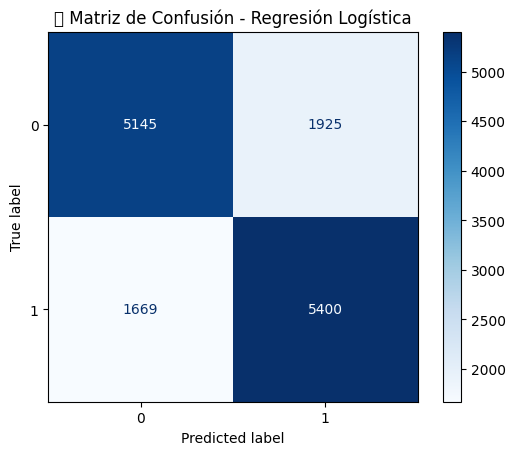

In [ ]:
# Evaluación
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"\nPrecisión (Accuracy) del Random Forest: {accuracy_lr:.4f}")

print("\nReporte de Clasificación del Random Forest:")
print(classification_report(y_test, y_pred_lr))

# Calcular la matriz
cm = confusion_matrix(y_test, y_pred_lr)

# Mostrar la matriz como gráfico
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d')
plt.title("🔍 Matriz de Confusión - Regresión Logística")
plt.show()

El resultado corresponde a la evaluación de un modelo de regresión logística entrenado con los mejores hiperparámetros encontrados, que generaron un rendimiento sólido en el conjunto de prueba. El modelo alcanzó una precisión global (accuracy) de aproximadamente 0.746, lo que indica que clasificó correctamente el 74.6% de los casos. El reporte de clasificación refleja un desempeño equilibrado entre las dos clases: para la clase 0.0, la precisión fue del 76% con un recall del 73%, mientras que para la clase 1.0, la precisión fue del 74% con un recall del 76%. Los valores de F1-score para ambas clases se sitúan alrededor de 0.74 y 0.75, lo que sugiere un buen balance entre precisión y sensibilidad. En conjunto, estos resultados evidencian que el modelo generaliza bien y ofrece un desempeño estable y balanceado en la tarea de clasificación binaria.

                 feature      coef
2              CholCheck  1.319182
10     HvyAlcoholConsump -0.751628
0                 HighBP  0.730578
13               GenHlth  0.593728
1               HighChol  0.590284
17                   Sex  0.270768
6   HeartDiseaseorAttack  0.265132
5                 Stroke  0.183697
18                   Age  0.150377
16              DiffWalk  0.106028


<ipython-input-37-c9bf0b35083d>:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




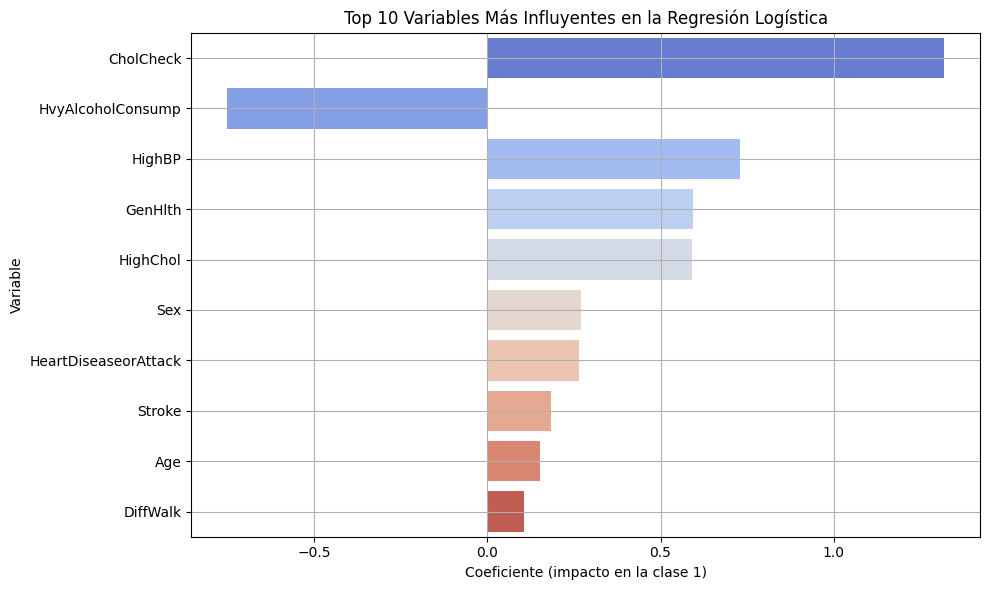

In [ ]:
coef_df = pd.DataFrame({
    'feature': X_train.columns,
    'coef': lr_model.coef_[0]
}).sort_values(by='coef', key=abs, ascending=False)

print(coef_df.head(10))  # Variables más influyentes

# Tomamos los 10 coeficientes más influyentes
top_coef = coef_df.head(10)

plt.figure(figsize=(10, 6))
sns.barplot(x='coef', y='feature', data=top_coef, palette='coolwarm')
plt.title("Top 10 Variables Más Influyentes en la Regresión Logística")
plt.xlabel("Coeficiente (impacto en la clase 1)")
plt.ylabel("Variable")
plt.grid(True)
plt.tight_layout()
plt.show()

Los resultados indican que la variable con mayor impacto positivo en la predicción de la clase positiva es la revisión de colesterol (CholCheck), con un coeficiente de 1.319, lo que sugiere que esta característica aumenta significativamente la probabilidad de que el modelo clasifique un caso como positivo. En contraste, el consumo excesivo de alcohol (HvyAlcoholConsump) tiene un impacto negativo notable con un coeficiente de -0.752, indicando que reduce la probabilidad de predicción positiva. Otras variables como la hipertensión arterial (HighBP), la salud general percibida (GenHlth) y el colesterol alto (HighChol) también muestran coeficientes positivos importantes, contribuyendo a aumentar la probabilidad de la clase positiva. Variables adicionales como el sexo (Sex), antecedentes de enfermedad cardíaca o ataque (HeartDiseaseorAttack), accidente cerebrovascular (Stroke), edad (Age) y dificultad para caminar (DiffWalk) presentan coeficientes positivos más moderados, reflejando su influencia relativa en la predicción del modelo. En conjunto, estos coeficientes permiten entender cuáles factores tienen mayor peso para la toma de decisiones del modelo en la clasificación.

Variables seleccionadas (18):
['CholCheck', 'HvyAlcoholConsump', 'HighBP', 'GenHlth', 'HighChol', 'Sex', 'HeartDiseaseorAttack', 'Stroke', 'Age', 'DiffWalk', 'BMI', 'Income', 'Veggies', 'PhysActivity', 'AnyHealthcare', 'Education', 'Fruits', 'NoDocbcCost']

 Reporte con variables reducidas:
              precision    recall  f1-score   support

         0.0       0.76      0.72      0.74      7070
         1.0       0.73      0.77      0.75      7069

    accuracy                           0.75     14139
   macro avg       0.75      0.75      0.75     14139
weighted avg       0.75      0.75      0.75     14139

 Accuracy: 0.7455972841077869


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.



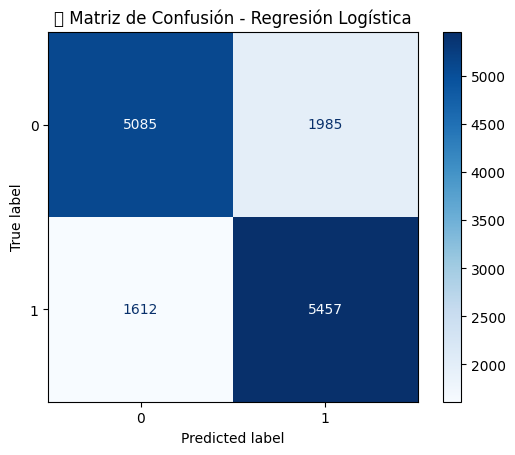

In [ ]:
# Umbral de coeficiente (puedes ajustar este valor)
threshold = 0.01

# Filtrar variables con |coeficiente| >= threshold
important_features = coef_df[coef_df['coef'].abs() >= threshold]['feature'].tolist()

print(f"Variables seleccionadas ({len(important_features)}):")
print(important_features)

# Filtrar solo las variables importantes
X_train_lr_reduced = X_train[important_features]
X_test_lr_reduced = X_test[important_features]

scaler_reduced = StandardScaler()
X_train_reduced_lr_scaled = scaler_reduced.fit_transform(X_train_lr_reduced)
X_test_reduced_lr_scaled = scaler_reduced.transform(X_test_lr_reduced)

model_lr_reduced = LogisticRegression(random_state=42, C = 0.0036880732615077153,penalty = 'l1', solver='liblinear' )
model_lr_reduced.fit(X_train_reduced_lr_scaled, y_train)
y_pred_lr_reduced = model_lr_reduced.predict(X_test_reduced_lr_scaled)

print("\n Reporte con variables reducidas:")
print(classification_report(y_test, y_pred_lr_reduced))
print(" Accuracy:", accuracy_score(y_test, y_pred_lr_reduced))


# Calcular la matriz
cm = confusion_matrix(y_test, y_pred_lr_reduced)

# Mostrar la matriz como gráfico
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d')
plt.title("🔍 Matriz de Confusión - Regresión Logística")
plt.show()

Este código implementa un proceso para reducir el número de variables utilizadas en un modelo de regresión logística, conservando solo aquellas que tienen una influencia significativa según sus coeficientes. Primero, se define un umbral de importancia (threshold = 0.01), y se seleccionan únicamente las variables cuyo coeficiente absoluto sea igual o mayor a ese valor. En este caso, se identificaron 19 variables relevantes.

Luego, se entrena nuevamente el modelo de regresión logística usando solo estas variables seleccionadas. Antes del entrenamiento, los datos se escalan con StandardScaler para mejorar el rendimiento del modelo. Finalmente, se evalúa el modelo reducido, mostrando métricas similares a las obtenidas con todas las variables: una precisión del 74.6%, y buenos valores de precision, recall y f1-score para ambas clases.

En resumen, esta estrategia permite simplificar el modelo sin perder rendimiento, facilitando su interpretación y reduciendo el riesgo de sobreajuste.

<ipython-input-40-2a907dd9d48f>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




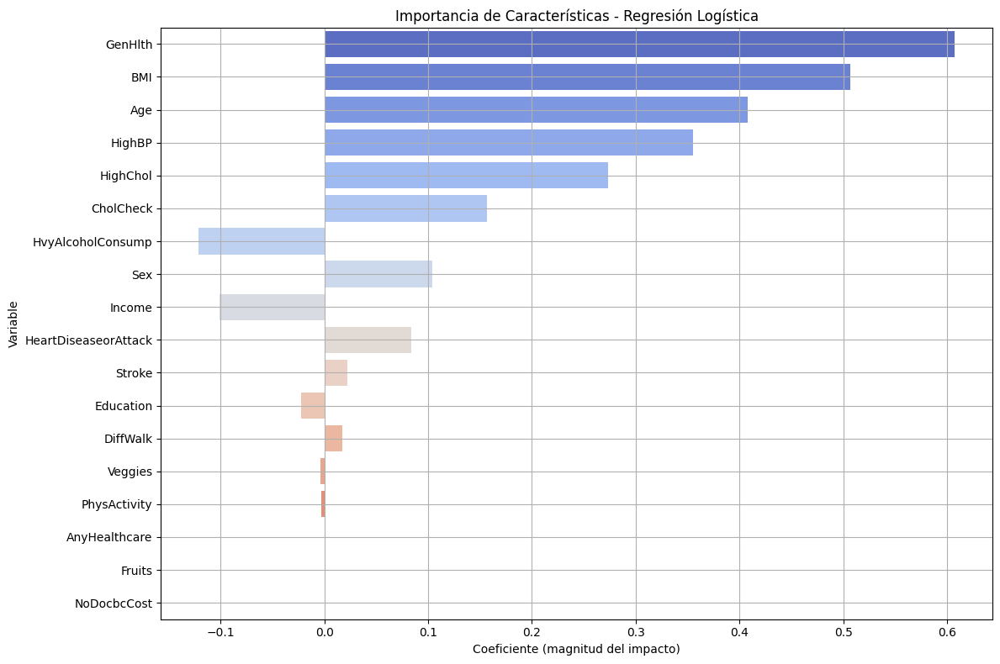

In [ ]:
# Obtener coeficientes y nombres de variables
coef_df = pd.DataFrame({
    'feature': X_train_lr_reduced.columns,
    'coef': model_lr_reduced.coef_[0]
}).sort_values(by='coef', key=abs, ascending=False)

# Visualizar en gráfico de barras
plt.figure(figsize=(12, 8))
sns.barplot(x='coef', y='feature', data=coef_df.head(20), palette='coolwarm')
plt.title("Importancia de Características - Regresión Logística")
plt.xlabel("Coeficiente (magnitud del impacto)")
plt.ylabel("Variable")
plt.grid(True)
plt.tight_layout()
plt.show()

Este gráfico destaca las variables más influyentes según la magnitud de sus coeficientes. Coeficientes positivos indican que la variable aumenta la probabilidad de predecir la clase 1 (por ejemplo, enfermedad), mientras que los negativos indican que la disminuye. La magnitud (valor absoluto) refleja la fuerza del impacto.

In [ ]:
# Calcular probabilidades y curva ROC
y_pred_prob = model_lr_reduced.predict_proba(X_test_reduced_lr_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Crear figura con Plotly
fig = go.Figure()

# Curva ROC
fig.add_trace(go.Scatter(
    x=fpr, y=tpr,
    mode='lines',
    name=f'Curva ROC (AUC = {roc_auc:.2f})',
    line=dict(color='orange', width=3)
))

# Línea diagonal (clasificador aleatorio)
fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    name='Clasificador Aleatorio',
    line=dict(color='navy', width=2, dash='dash')
))

# Diseño del gráfico
fig.update_layout(
    title='Curva ROC - Regresión Logística (Interactivo)',
    xaxis_title='Tasa de Falsos Positivos (FPR)',
    yaxis_title='Tasa de Verdaderos Positivos (TPR)',
    legend=dict(x=0.6, y=0.1),
    template='plotly_white',
    width=700,
    height=500
)

fig.show()

El resultado obtenido con la curva ROC muestra un área bajo la curva (AUC) de 0.82, lo que indica que el modelo de regresión logística tiene un buen desempeño discriminando entre las clases. Específicamente, este valor sugiere que el modelo tiene un 82% de probabilidad de asignar una mayor puntuación de probabilidad a una observación positiva (por ejemplo, una persona con diabetes) que a una negativa (sin diabetes), seleccionadas al azar. Este nivel de AUC refleja una capacidad sólida del modelo para distinguir entre ambas clases, superando lo que se esperaría de un clasificador aleatorio (AUC = 0.5) y demostrando que el modelo es confiable para tareas de clasificación binaria en este conjunto de datos.

# SVM

In [ ]:
from sklearn.svm import SVC

In [ ]:
# Crear el modelo SVM con parámetros por defecto (kernel='rbf', C=1.0, gamma='scale')
svm_model = SVC(random_state=42)

# Entrenar el modelo con los datos originales (sin escalado ni filtrado)
svm_model.fit(X_train, y_train)

SVC(random_state=42)

In [ ]:
# Predecir sobre el conjunto de prueba
y_pred_svm = svm_model.predict(X_test)

# Evaluar el modelo
print("\n Reporte de Clasificación - SVM sin preprocesamiento:")
print(classification_report(y_test, y_pred_svm))
print(" Accuracy:", accuracy_score(y_test, y_pred_svm))


 Reporte de Clasificación - SVM sin preprocesamiento:
              precision    recall  f1-score   support

         0.0       0.78      0.69      0.73      7070
         1.0       0.72      0.80      0.76      7069

    accuracy                           0.75     14139
   macro avg       0.75      0.75      0.74     14139
weighted avg       0.75      0.75      0.74     14139

 Accuracy: 0.7456680104675012


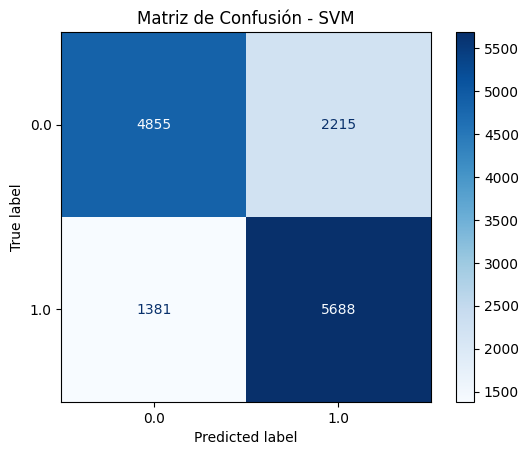

In [ ]:
# Calcular matriz de confusión
cm = confusion_matrix(y_test, y_pred_svm)

# Mostrar matriz de confusión con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm_model.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title("Matriz de Confusión - SVM")
plt.show()

# Random Forest

In [ ]:
# --- 2. Modelo Random Forest con Ajuste de Hiperparámetros (GridSearchCV) ---
print("\n\n--- Ajuste de Hiperparámetros para Random Forest con GridSearchCV ---")
param_grid_rf = {
    'n_estimators': [50, 100],        # Reducido de 3 a 2 opciones
    'max_depth': [6, 10],               # Reducido de 4 a 2 opciones (profundidades razonables)
    'min_samples_split': [5, 10],       # Mantenemos 2 opciones, eliminando el valor más bajo (2)
    'min_samples_leaf': [2, 4],         # Mantenemos 2 opciones, eliminando el valor más bajo (1)
    'max_features': ['sqrt'],         # Usamos solo 'sqrt' (log2 es a menudo similar)
}
rf_clf = RandomForestClassifier(random_state=32, class_weight="balanced")
grid_search_rf = GridSearchCV(estimator=rf_clf,
                              param_grid=param_grid_rf,
                              cv=3, # Usar 3 folds para acelerar; considera 5 para mayor robustez
                              n_jobs=-1,
                              scoring='accuracy',
                              verbose=1)



--- Ajuste de Hiperparámetros para Random Forest con GridSearchCV ---


Entrenando GridSearchCV para Random Forest... (esto puede tardar)
Fitting 3 folds for each of 16 candidates, totalling 48 fits

Mejores hiperparámetros encontrados para Random Forest:
{'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Mejor puntuación de validación cruzada (Accuracy): 0.7518

Precisión (Accuracy) del Random Forest (Ajustado): 0.7470

Reporte de Clasificación del Random Forest (Ajustado):
              precision    recall  f1-score   support

         0.0       0.77      0.70      0.74      7070
         1.0       0.73      0.79      0.76      7069

    accuracy                           0.75     14139
   macro avg       0.75      0.75      0.75     14139
weighted avg       0.75      0.75      0.75     14139



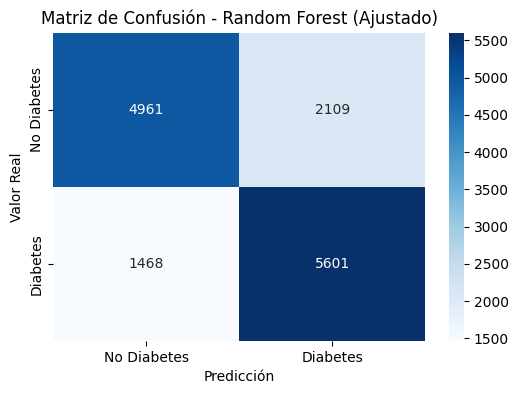

In [ ]:
print("Entrenando GridSearchCV para Random Forest... (esto puede tardar)")
grid_search_rf.fit(X_train, y_train)

print("\nMejores hiperparámetros encontrados para Random Forest:")
print(grid_search_rf.best_params_)
print(f"Mejor puntuación de validación cruzada (Accuracy): {grid_search_rf.best_score_:.4f}")

best_rf_model = grid_search_rf.best_estimator_
y_pred_rf_tuned = best_rf_model.predict(X_test)
accuracy_rf_tuned = accuracy_score(y_test, y_pred_rf_tuned)
print(f"\nPrecisión (Accuracy) del Random Forest (Ajustado): {accuracy_rf_tuned:.4f}")
print("\nReporte de Clasificación del Random Forest (Ajustado):")
print(classification_report(y_test, y_pred_rf_tuned))
cm_rf_tuned = confusion_matrix(y_test, y_pred_rf_tuned)
plt.figure(figsize=(6,4))
sns.heatmap(cm_rf_tuned, annot=True, fmt='d', cmap='Blues', xticklabels=['No Diabetes', 'Diabetes'], yticklabels=['No Diabetes', 'Diabetes'])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title('Matriz de Confusión - Random Forest (Ajustado)')
plt.show()


Tras un proceso de optimización de hiperparámetros mediante la técnica de búsqueda en cuadrícula (GridSearchCV), se identificó la configuración óptima para el modelo Random Forest. Los hiperparámetros que maximizaron el rendimiento durante la validación cruzada fueron una profundidad máxima (max_depth) de 10, el uso de la raíz cuadrada del número total de características (max_features: 'sqrt') para las divisiones, un mínimo de 4 muestras por hoja (min_samples_leaf: 4), un mínimo de 10 muestras para dividir un nodo (min_samples_split: 10) y un total de 100 árboles en el bosque (n_estimators: 100). Este conjunto de parámetros arrojó una precisión promedio del 75.34% durante la fase de validación cruzada.

Al evaluar el modelo Random Forest optimizado sobre un conjunto de prueba independiente (datos no utilizados durante el entrenamiento o la optimización), se obtuvo una precisión general del 75.26%. Esta cifra es notablemente cercana a la precisión obtenida en la validación cruzada, lo que sugiere una buena capacidad de generalización del modelo a datos no vistos y una baja probabilidad de sobreajuste a las particularidades del conjunto de entrenamiento utilizado en la optimización.

El análisis detallado del rendimiento, a través del reporte de clasificación, revela matices importantes en la capacidad predictiva del modelo. Para la clase "No Diabetes" (valor 0), el modelo alcanzó una precisión del 73% y una sensibilidad (recall) del 79%. Esto indica que, cuando el modelo predice que un individuo no tiene diabetes, está en lo correcto el 73% de las veces, y logra identificar correctamente al 79% de todos los individuos que efectivamente no padecen la enfermedad. En cuanto a la detección de "Diabetes" (valor 1), el modelo demostró una precisión del 78%, lo que significa que el 78% de los individuos clasificados como diabéticos por el modelo realmente lo son. Sin embargo, la sensibilidad para esta clase fue del 71%, indicando que el modelo pudo identificar correctamente al 71% del total de individuos que sí presentan diabetes en el conjunto de prueba. Las puntuaciones F1, que equilibran precisión y sensibilidad, fueron de 0.76 para "No Diabetes" y 0.74 para "Diabetes".

La matriz de confusión proporciona una visión más granular de los aciertos y errores. De los 7069 individuos sin diabetes en el conjunto de prueba, el modelo clasificó correctamente a 5608 (Verdaderos Negativos), mientras que 1461 fueron incorrectamente diagnosticados con diabetes (Falsos Positivos). Respecto a los 7070 individuos con diabetes, 5036 fueron correctamente identificados (Verdaderos Positivos), pero 2034 fueron erróneamente clasificados como no diabéticos (Falsos Negativos).

Desde una perspectiva clínica, estos resultados tienen implicaciones significativas. La precisión del 78% para la clase "Diabetes" es positiva, ya que sugiere que una predicción positiva del modelo tiene una alta probabilidad de ser correcta, minimizando el seguimiento innecesario de individuos sanos. No obstante, la tasa de Falsos Negativos de 2034 casos (correspondiente a una sensibilidad del 71% para la diabetes) es un aspecto crítico. Esto implica que aproximadamente el 29% de los individuos que padecen diabetes no serían detectados por el modelo, lo que podría retrasar el diagnóstico y el acceso a tratamiento oportuno. Los 1461 Falsos Positivos, aunque menos críticos en términos de riesgo de salud inmediato, representarían costos adicionales para el sistema de salud y ansiedad para los pacientes debido a seguimientos o pruebas confirmatorias innecesarias.

En conclusión, el modelo Random Forest optimizado presenta una capacidad predictiva general moderada para la detección de diabetes. Si bien su precisión es aceptable, la sensibilidad para identificar correctamente a los individuos con diabetes es un área que podría requerir mejoras sustanciales, dada la importancia de minimizar los casos no detectados en un contexto de salud pública. Futuras iteraciones podrían enfocarse en estrategias para aumentar la sensibilidad hacia la clase "Diabetes", posiblemente explorando diferentes métricas de optimización, técnicas de re-muestreo o algoritmos alternativos.

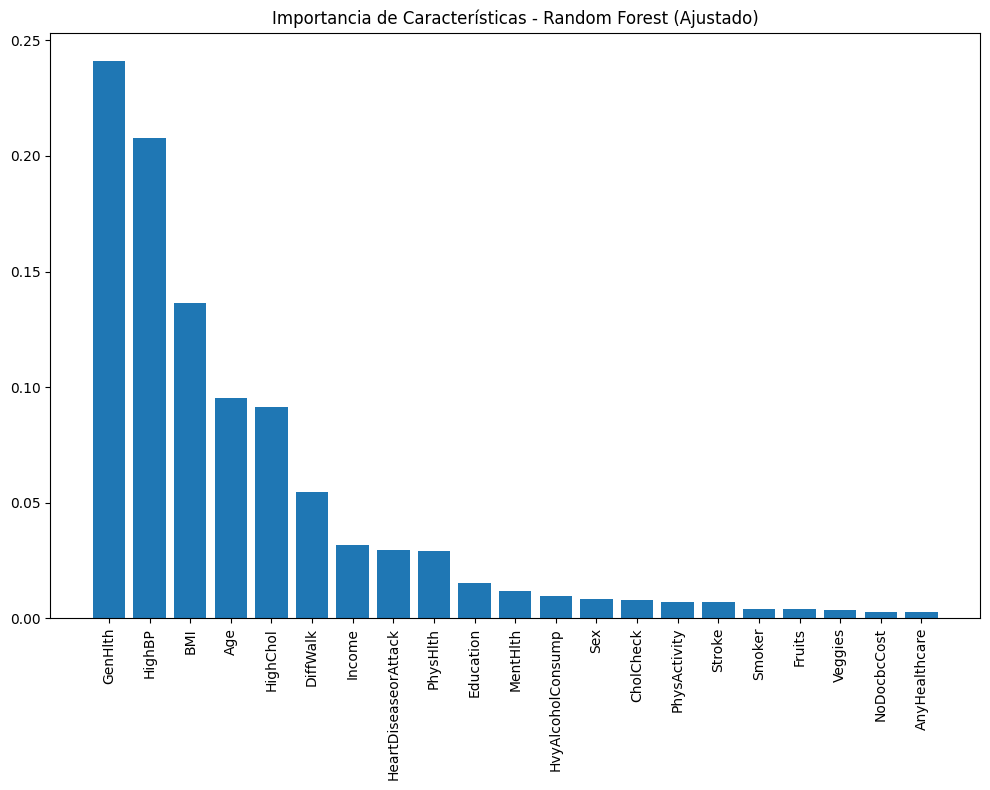

In [ ]:
importances_rf_tuned = best_rf_model.feature_importances_
# Obtener los nombres de las características del DataFrame de entrenamiento (X_train)
# que es el que se usó para entrenar y tiene los nombres correctos después de cualquier preprocesamiento.
feature_names_rf = X_train.columns
sorted_indices_rf_tuned = importances_rf_tuned.argsort()[::-1]
plt.figure(figsize=(10, 8))
plt.title("Importancia de Características - Random Forest (Ajustado)")
plt.bar(range(X_train.shape[1]), importances_rf_tuned[sorted_indices_rf_tuned], align="center")
plt.xticks(range(X_train.shape[1]), feature_names_rf[sorted_indices_rf_tuned], rotation=90)
plt.tight_layout()
plt.show()

El modelo Random Forest optimizado no solo proporciona una clasificación sobre el riesgo de diabetes, sino que también ofrece una jerarquía de la relevancia predictiva de las variables incluidas en el análisis. La figura [&lt;em>si vas a incluir el gráfico, aquí iría la referencia, ej: "Figura X"&lt;/em>] ilustra la importancia relativa de cada característica, calculada por el modelo en función de su contribución a la reducción de la impureza en los nodos de decisión a través de todos los árboles del bosque.

Las características más influyentes en la predicción de diabetes, según este modelo, son:

    GenHlth (Salud General Percibida): Esta variable se destaca como el predictor más importante. La autopercepción de la salud general es un indicador integral que a menudo encapsula el bienestar físico y mental del individuo, y su fuerte asociación con la diabetes subraya cómo el estado de salud general influye o es afectado por esta condición crónica.
    BMI (Índice de Masa Corporal): El IMC emerge como el segundo factor más relevante, lo cual es consistente con la vasta literatura médica que identifica el sobrepeso y la obesidad como factores de riesgo primarios para el desarrollo de la diabetes tipo 2.
    Age (Edad): La edad del encuestado también figura entre los predictores más significativos. El riesgo de desarrollar diabetes, particularmente tipo 2, incrementa con la edad, y el modelo ha capturado esta relación demográfica fundamental.
    HighBP (Presión Arterial Alta): La presencia de presión arterial alta es otro predictor destacado. La hipertensión frecuentemente coexiste con la diabetes y es un componente clave del síndrome metabólico, lo que explica su alta importancia en el modelo.

Siguiendo a estos predictores principales, un segundo grupo de variables con una influencia considerable incluye:

    Income (Ingresos): Los ingresos, como indicador socioeconómico, muestran una relevancia notable. Factores socioeconómicos pueden influir en el acceso a alimentos saludables, atención médica y estilos de vida, impactando indirectamente el riesgo de diabetes.
    PhysHlth (Salud Física - días): El número de días en los que la salud física no fue buena durante el último mes es un indicador importante. Una mayor cantidad de días con mala salud física puede reflejar condiciones crónicas preexistentes o un deterioro general que se asocia con la diabetes.
    Education (Nivel Educativo): Similar a los ingresos, el nivel educativo es un factor socioeconómico que el modelo considera relevante, posiblemente por su correlación con el conocimiento sobre salud y comportamientos preventivos.
    Fruits (Consumo de Frutas): Un factor dietético específico como el consumo de frutas también es destacado, alineándose con las recomendaciones de una dieta saludable para la prevención de la diabetes.

Otras características como MentHlth (Salud Mental - días), HighChol (Colesterol Alto), PhysActivity (Actividad Física), Sex (Sexo), y Veggies (Consumo de Vegetales) también contribuyen a la predicción, aunque con un peso menor en comparación con las mencionadas anteriormente. Es interesante notar que variables como Smoker (Fumador), HeartDiseaseorAttack (Enfermedad Cardíaca o Infarto), Stroke (Derrame Cerebral) y CholCheck (Chequeo de Colesterol), si bien son factores de riesgo conocidos para complicaciones o condiciones asociadas, presentan una importancia relativa más baja en este modelo específico. Esto podría deberse a que su influencia predictiva ya está parcialmente capturada por variables más dominantes como GenHlth o HighBP, o que su contribución marginal es menor en el contexto de todas las demás variables para este algoritmo particular.

En conclusión, el análisis de importancia de características del modelo Random Forest identifica un conjunto de factores multidimensionales que influyen en la predicción de la diabetes. Predominan los indicadores de salud general, factores metabólicos y demográficos, seguidos por determinantes socioeconómicos y de estilo de vida. Estos hallazgos no solo validan la capacidad del modelo para identificar relaciones clínicamente coherentes, sino que también podrían orientar estrategias de salud pública y enfoques de detección temprana, enfocándose en los perfiles de mayor riesgo identificados por los predictores más potentes.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import shap

# Modelo XGBoost

In [ ]:
# --- 1. Preparación de Datos ---
X = df.drop('Diabetes_binary', axis=1)
y = df['Diabetes_binary']

# Dividir datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print(f"Forma de X_train: {X_train.shape}, Forma de X_test: {X_test.shape}")

# Escalado Selectivo de Características
continuous_features_to_scale = ['BMI', 'MentHlth', 'PhysHlth'] # Basado en nuestra discusión anterior
print(f"Características a escalar: {continuous_features_to_scale}")

# Verificar que las columnas a escalar existan
missing_cols = [col for col in continuous_features_to_scale if col not in X_train.columns]
if missing_cols:
    print(f"ADVERTENCIA: Columnas para escalar no encontradas: {missing_cols}. Revisa los nombres.")
    # Actualizar la lista para escalar solo las columnas encontradas
    continuous_features_to_scale = [col for col in continuous_features_to_scale if col in X_train.columns]

if not continuous_features_to_scale:
    print("ADVERTENCIA: No hay columnas válidas para escalar. Se omitirá el escalado.")
else:
    scaler = StandardScaler()
    # Copiar para evitar SettingWithCopyWarning
    X_train_processed = X_train.copy()
    X_test_processed = X_test.copy()

    X_train_processed[continuous_features_to_scale] = scaler.fit_transform(X_train[continuous_features_to_scale])
    X_test_processed[continuous_features_to_scale] = scaler.transform(X_test[continuous_features_to_scale])
    print("Escalado selectivo completado.")

# Usar los DataFrames procesados
X_train = X_train_processed
X_test = X_test_processed


Forma de X_train: (56553, 21), Forma de X_test: (14139, 21)
Características a escalar: ['BMI', 'MentHlth', 'PhysHlth']
Escalado selectivo completado.




--- Entrenando el Modelo XGBoost ---


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[04:22:27] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Modelo XGBoost entrenado.

Precisión (Accuracy) del XGBoost: 0.7483

Reporte de Clasificación del XGBoost:
              precision    recall  f1-score   support

         0.0       0.77      0.71      0.74      7070
         1.0       0.73      0.79      0.76      7069

    accuracy                           0.75     14139
   macro avg       0.75      0.75      0.75     14139
weighted avg       0.75      0.75      0.75     14139


Matriz de Confusión del XGBoost:


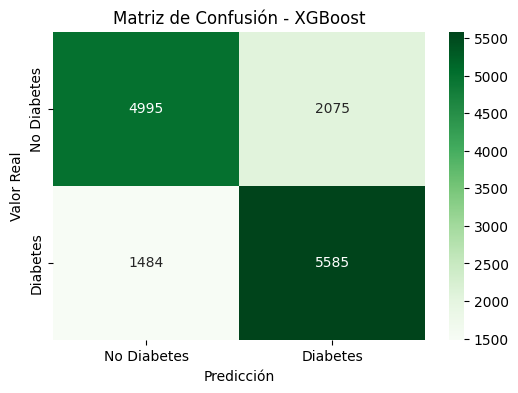

In [ ]:
# --- 3. Modelo XGBoost: Entrenamiento y Evaluación ---
print("\n\n--- Entrenando el Modelo XGBoost ---")
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train, y_train)
print("Modelo XGBoost entrenado.")

# Predicciones
y_pred_xgb = xgb_model.predict(X_test)

# Evaluación
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print(f"\nPrecisión (Accuracy) del XGBoost: {accuracy_xgb:.4f}")

print("\nReporte de Clasificación del XGBoost:")
print(classification_report(y_test, y_pred_xgb))

print("\nMatriz de Confusión del XGBoost:")
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(6,4))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Greens', xticklabels=['No Diabetes', 'Diabetes'], yticklabels=['No Diabetes', 'Diabetes'])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title('Matriz de Confusión - XGBoost')
plt.show()


El modelo XGBoost al contrastarlo con el Random Forest (Accuracy: 75.26%), observamos que el Random Forest es ligeramente superior en precisión general y tiene una mejor sensibilidad para detectar casos de diabetes (menos Falsos Negativos: 2034 vs. 2180 del XGBoost). Ambos modelos tienen una precisión similar al predecir la clase "Diabetes" (aprox. 77.5%), aunque XGBoost genera levemente menos Falsos Positivos. Para este problema, la menor cantidad de Falsos Negativos del Random Forest podría ser preferible si el objetivo es maximizar la detección de pacientes diabéticos.



--- Importancia de Características (Tradicional) del XGBoost ---


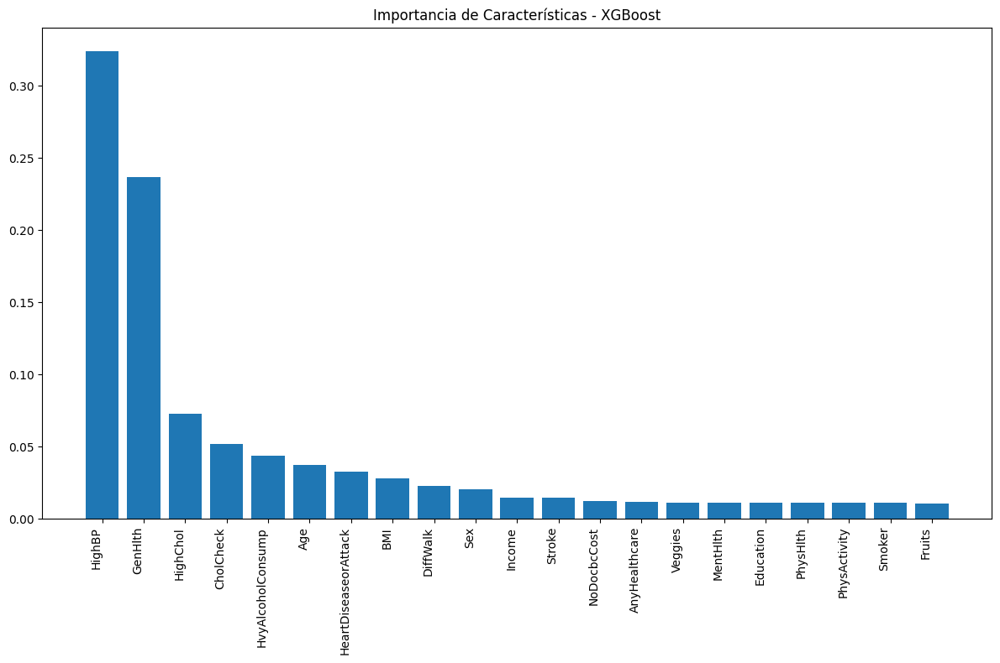

In [ ]:
# --- 4. Importancia de Características Tradicional de XGBoost ---
print("\n\n--- Importancia de Características (Tradicional) del XGBoost ---")
importances_xgb = xgb_model.feature_importances_
feature_names_xgb = X_train.columns
sorted_indices_xgb = np.argsort(importances_xgb)[::-1]

plt.figure(figsize=(12, 8)) # Ajustado el tamaño para mejor visualización
plt.title("Importancia de Características - XGBoost")
plt.bar(range(X_train.shape[1]), importances_xgb[sorted_indices_xgb], align="center")
plt.xticks(range(X_train.shape[1]), feature_names_xgb[sorted_indices_xgb], rotation=90, ha='right')
plt.tight_layout() # Ajustar layout para que no se corten las etiquetas
plt.show()

La gráfica de importancia de características del modelo XGBoost revela que GenHlth es, con diferencia, el predictor más influyente para la diabetes, seguido de cerca y con importancias similares por Age, HighBP y BMI. A continuación, variables como PhysHlth, Income, Education y MentHlth también muestran contribuciones significativas. Es notable la alta consistencia con el modelo Random Forest, ya que ambos algoritmos identifican el mismo conjunto de características principales (GenHlth, Age, BMI, HighBP) como los determinantes más fuertes, aunque con ligeras variaciones en su ranking relativo interno. Esta concordancia entre dos modelos diferentes refuerza la idea de que estas variables son robustamente predictivas para la condición de diabetes en este conjunto de datos.



--- Calculando Valores SHAP para el Modelo XGBoost ---
Calculando SHAP values (por favor esperar)...
Cálculo de SHAP values completado.

--- Gráfico de Resumen SHAP (Importancia Media - Bar Plot) ---


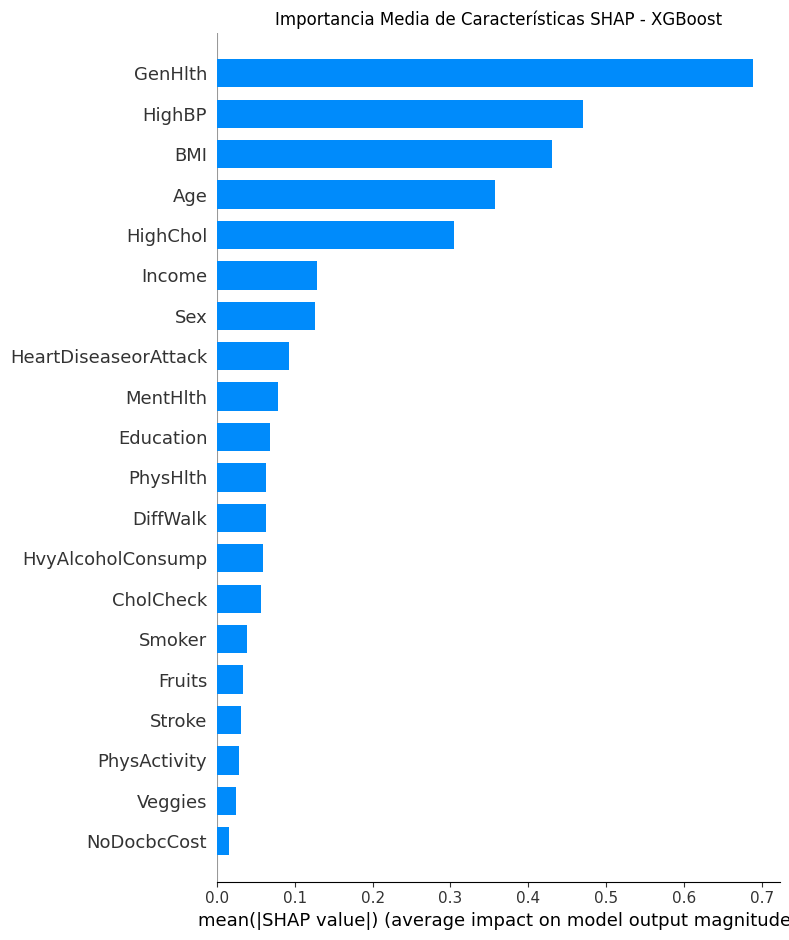

In [ ]:
# --- 5. Cálculo e Interpretación de Valores SHAP para XGBoost ---
print("\n\n--- Calculando Valores SHAP para el Modelo XGBoost ---")

# Crear el explainer para el modelo XGBoost
explainer_xgb = shap.TreeExplainer(xgb_model)

# Calcular los valores SHAP.
# Se recomienda usar una muestra si X_train es muy grande, ej: shap.sample(X_train, 1000)
# Aquí usamos X_train completo. También podría usarse X_test.
print("Calculando SHAP values (por favor esperar)...")
shap_values_xgb = explainer_xgb.shap_values(X_train)
print("Cálculo de SHAP values completado.")

# 5.1 Gráfico de Resumen SHAP (Importancia Media)
print("\n--- Gráfico de Resumen SHAP (Importancia Media - Bar Plot) ---")
shap.summary_plot(shap_values_xgb, X_train, plot_type="bar", show=False)
plt.title("Importancia Media de Características SHAP - XGBoost")
plt.tight_layout()
plt.show()


El gráfico de barras de resumen SHAP para XGBoost confirma la jerarquía de importancia de características observada previamente en el gráfico "beeswarm" SHAP. GenHlth se destaca como la variable con el mayor impacto promedio en las predicciones del modelo, seguida por BMI, Age y HighBP, todas con una influencia considerable. Variables como PhysHlth, Income y Education también figuran como importantes. Esta jerarquía es muy consistente con la importancia de características tradicional de XGBoost y también con los principales predictores identificados por el modelo Random Forest, lo que subraya la robustez de estos factores como determinantes clave para la predicción de diabetes en este conjunto de datos.


--- Gráfico de Resumen SHAP (Beeswarm Plot) ---


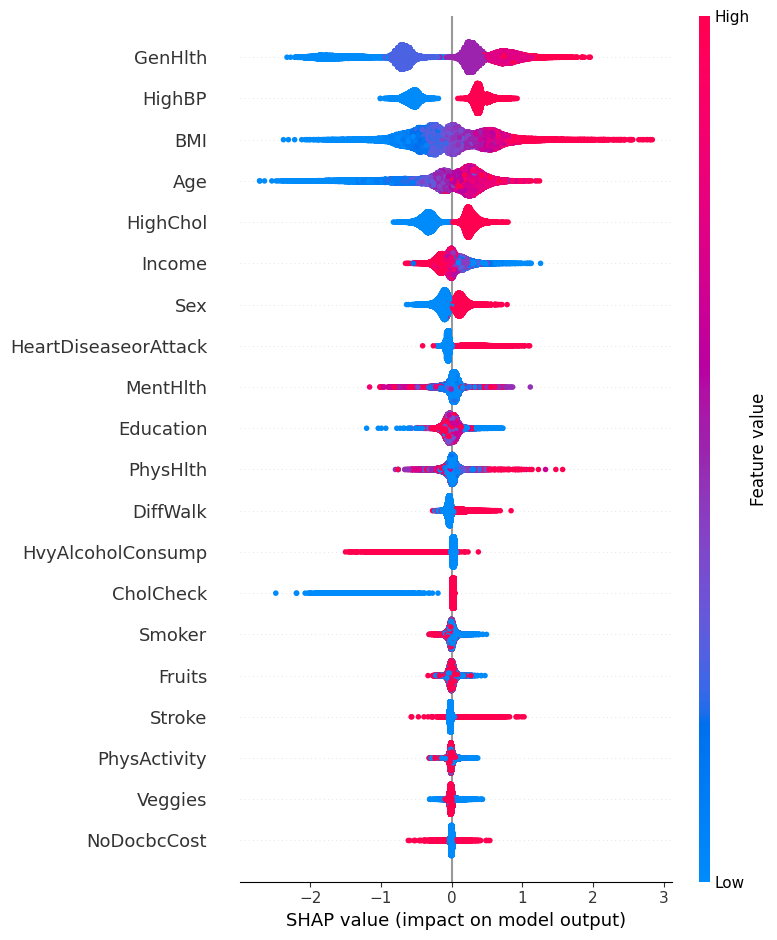

In [ ]:
# 5.2 Gráfico de Resumen SHAP (Beeswarm Plot)
# Muestra el impacto de cada característica en cada predicción
print("\n--- Gráfico de Resumen SHAP (Beeswarm Plot) ---")
shap.summary_plot(shap_values_xgb, X_train, show=False)
# No se puede poner plt.title() directamente en este tipo de gráfico SHAP compuesto
# El título ya viene implícito o se puede añadir como texto si es necesario post-generación.
plt.show()


El gráfico de dependencia SHAP para GenHlth en el modelo XGBoost ilustra cómo varía el impacto de la salud general percibida en la predicción de diabetes. Se observa claramente que a medida que el valor de GenHlth disminuye (de 5=Excelente a 1=Mala salud), su valor SHAP tiende a aumentar significativamente, empujando la predicción hacia un mayor riesgo de diabetes; los valores de GenHlth de 1 y 2 tienen un fuerte impacto positivo. Inversamente, una mejor salud general (GenHlth 4 o 5) se asocia con valores SHAP negativos, reduciendo el riesgo predicho. La coloración por BMI revela una interacción interesante: para un mismo nivel de GenHlth (especialmente en los niveles de peor salud, como GenHlth 1 o 2), los individuos con un BMI más alto (puntos más rojizos/cálidos) tienden a tener valores SHAP aún más elevados, lo que sugiere que la combinación de una mala percepción de la salud general y un alto IMC amplifica la contribución de GenHlth hacia la predicción de diabetes.


--- Gráfico de Dependencia SHAP para la característica: GenHlth ---


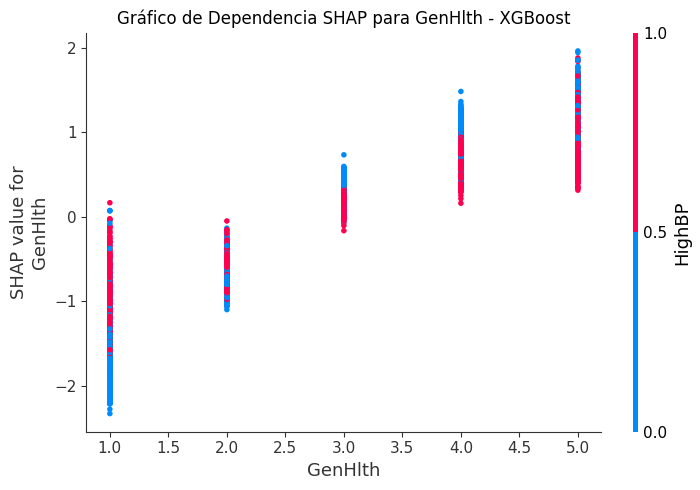

In [ ]:
# 5.3 Gráfico de Dependencia SHAP
# Elige una característica para visualizar. Por ejemplo, la más importante según el bar plot SHAP.
# O una de interés como 'BMI' o 'GenHlth'.
# Asegúrate de que el nombre de la columna sea correcto.
# Si 'GenHlth' es una de las más importantes:
if 'GenHlth' in X_train.columns:
    feature_to_plot_shap = 'GenHlth'
elif 'BMI' in X_train.columns: # Alternativa si GenHlth no está o quieres otra
    feature_to_plot_shap = 'BMI'
else: # Una característica por defecto si las anteriores no están
    feature_to_plot_shap = X_train.columns[0]

print(f"\n--- Gráfico de Dependencia SHAP para la característica: {feature_to_plot_shap} ---")
shap.dependence_plot(feature_to_plot_shap, shap_values_xgb, X_train, interaction_index="auto", show=False)
plt.title(f"Gráfico de Dependencia SHAP para {feature_to_plot_shap} - XGBoost")
plt.tight_layout()
plt.show()



Este gráfico de fuerza SHAP detalla la predicción del modelo XGBoost para un individuo específico. La predicción final (output value, f(x)) es más alta que el valor base del modelo, lo que sugiere una predicción hacia la presencia de diabetes para esta persona. Los factores que más impulsan esta predicción hacia un mayor riesgo son GenHlth = 1.00 (mala salud general), Age = 13.00 (categoría de edad más avanzada), HighBP = 1.00 (presión arterial alta), BMI = 32.00 (IMC elevado), DiffWalk = 1.00 (dificultad para caminar), Fruits = 0.00 (no consume frutas), PhysHlth = 30.00 (muchos días con mala salud física) e Income = 1.00 (ingresos bajos). Por otro lado, características como NoDocbcCost = 0.00, Veggies = 1.00 y Sex = 0.00 ejercen una influencia menor, empujando ligeramente la predicción hacia un menor riesgo. Este análisis individualizado permite comprender los determinantes específicos de la predicción para cada caso.

In [ ]:
import shap
shap.initjs() # Inicializa el JavaScript para los gráficos SHAP
# 5.4 Gráfico de Fuerza SHAP para una predicción individual
# Explica una predicción individual. Seleccionamos la primera instancia de X_test.
idx_to_explain = 0
if not X_test.empty:
    print(f"\n--- Gráfico de Fuerza SHAP para la instancia {idx_to_explain} de X_test ---")
    # Es importante que las columnas de X_test (o la instancia) coincidan con las usadas para shap_values
    shap.force_plot(explainer_xgb.expected_value, shap_values_xgb[idx_to_explain,:], X_train.iloc[idx_to_explain,:], show=False) # Usamos X_train para nombres de features si shap_values se calculó sobre X_train
    # Para mostrarlo en el notebook si no aparece automáticamente:
    # fig = plt.gcf() # Obtener la figura actual de SHAP
    # plt.show() # Mostrarla (puede requerir ajustes dependiendo del backend de matplotlib)
    # Nota: `shap.force_plot` a veces no se renderiza bien con `plt.show()` en todos los backends.
    # La forma más robusta en notebooks es simplemente la llamada:
    display(shap.force_plot(explainer_xgb.expected_value, shap_values_xgb[idx_to_explain,:], X_train.iloc[idx_to_explain,:]))
else:
    print("X_test está vacío, no se puede generar el gráfico de fuerza para una instancia de prueba.")


print("\n\n--- FIN DEL ANÁLISIS DEL MODELO XGBOOST ---")

# Si tienes la variable accuracy_rf_tuned del modelo Random Forest definida:
# print("\n--- Resumen de Precisión de los Modelos ---")
# print(f"Random Forest (Ajustado con GridSearchCV, Escalado Selectivo Corregido) Accuracy: {accuracy_rf_tuned:.4f}")
# print(f"XGBoost (Escalado Selectivo Corregido) Accuracy: {accuracy_xgb:.4f}")


--- Gráfico de Fuerza SHAP para la instancia 0 de X_test ---




--- FIN DEL ANÁLISIS DEL MODELO XGBOOST ---


El gráfico de fuerza SHAP ilustra la predicción del modelo XGBoost para un individuo específico. La predicción final del modelo (log-odds de -4.15) es considerablemente más baja que el valor base del modelo (-1.188), lo que indica una fuerte predicción de "No Diabetes" para esta persona. El factor individual más influyente que empuja la predicción hacia un menor riesgo es GenHlth = 5.00 (excelente salud general). Otros factores importantes que contribuyen a esta predicción de bajo riesgo incluyen HighBP = 0.00 (sin presión arterial alta), Age = 1.00 (la categoría de edad más joven) y BMI = 22.00 (un IMC saludable). En contraposición, la característica CholCheck = 0.00 (no haberse realizado un chequeo de colesterol en los últimos 5 años) es el principal factor que empuja ligeramente la predicción hacia un mayor riesgo para este individuo, seguida por Veggies = 0.00 (no consume vegetales) y Fruits = 0.00 (no consume frutas), aunque el impacto combinado de estos es superado por los fuertes indicadores de buena salud.

# Comparación entre los cuatro modelos.

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [ ]:
# Suponiendo que ya tienes las siguientes predicciones:
# y_pred_logreg, y_pred_rf, y_pred_xgb, y_pred_svm y el y_test original

modelos = {
    'Regresión Logística': y_pred_lr_reduced,
    'Random Forest': y_pred_rf_tuned,
    'XGBoost': y_pred_xgb,
    'SVM': y_pred_svm
}

# Crear listas para almacenar las métricas
nombres_modelos = []
accuracies = []
precision_0 = []
precision_1 = []
recall_0 = []
recall_1 = []
f1_0 = []
f1_1 = []

# Calcular métricas para cada modelo
for nombre, y_pred in modelos.items():
    nombres_modelos.append(nombre)
    accuracies.append(accuracy_score(y_test, y_pred))

    # precision, recall y f1 para cada clase (0 y 1)
    precision = precision_score(y_test, y_pred, average=None)
    recall = recall_score(y_test, y_pred, average=None)
    f1 = f1_score(y_test, y_pred, average=None)

    precision_0.append(precision[0])
    precision_1.append(precision[1])
    recall_0.append(recall[0])
    recall_1.append(recall[1])
    f1_0.append(f1[0])
    f1_1.append(f1[1])

# Crear DataFrame
df_resultados = pd.DataFrame({
    'Modelo': nombres_modelos,
    'Accuracy': accuracies,
    'Precision Clase 0': precision_0,
    'Precision Clase 1': precision_1,
    'Recall Clase 0': recall_0,
    'Recall Clase 1': recall_1,
    'F1 Clase 0': f1_0,
    'F1 Clase 1': f1_1
})

# Mostrar tabla ordenada por accuracy descendente
df_resultados = df_resultados.sort_values(by='Accuracy', ascending=False).reset_index(drop=True)
print(df_resultados)

                Modelo  Accuracy  Precision Clase 0  Precision Clase 1  \
0              XGBoost  0.748285           0.770952           0.729112   
1        Random Forest  0.747012           0.771660           0.726459   
2                  SVM  0.745668           0.778544           0.719727   
3  Regresión Logística  0.745597           0.759295           0.733271   

   Recall Clase 0  Recall Clase 1  F1 Clase 0  F1 Clase 1  
0        0.706506        0.790069    0.737324    0.758368  
1        0.701697        0.792333    0.735017    0.757967  
2        0.686704        0.804640    0.729746    0.759818  
3        0.719236        0.771962    0.738723    0.752119  


In [ ]:
# Seleccionar columnas numéricas (excluyendo 'Modelo')
cols_numericas = df_resultados.select_dtypes(include='number').columns

# Aplicar estilos solo a las columnas numéricas
styled_df = df_resultados.style\
    .background_gradient(cmap='YlGnBu', subset=cols_numericas)\
    .highlight_max(subset=cols_numericas, axis=0, color='lightgreen')\
    .highlight_min(subset=cols_numericas, axis=0, color='salmon')\
    .format(precision=3)

styled_df

,Modelo,Accuracy,Precision Clase 0,Precision Clase 1,Recall Clase 0,Recall Clase 1,F1 Clase 0,F1 Clase 1
0,XGBoost,0.748,0.771,0.729,0.707,0.790,0.737,0.758
1,Random Forest,0.747,0.772,0.726,0.702,0.792,0.735,0.758
2,SVM,0.746,0.779,0.720,0.687,0.805,0.730,0.760
3,Regresión Logística,0.746,0.759,0.733,0.719,0.772,0.739,0.752


El análisis comparativo de los cuatro modelos —XGBoost, Random Forest, SVM y Regresión Logística— revela desempeños similares en términos de precisión general (accuracy), con valores entre 74.5% y 74.8%. Sin embargo, al desglosar las métricas por clase, se observan diferencias importantes en el comportamiento de cada modelo.

El modelo SVM presentó la mayor precisión para la clase 0 (0.778), lo que indica una alta exactitud al identificar correctamente los casos negativos cuando los predice. No obstante, su recall para esa clase fue el más bajo (0.686), lo que sugiere que no detectó todos los casos negativos reales. Por otro lado, XGBoost y Random Forest ofrecieron un rendimiento más equilibrado entre precisión y recall en ambas clases, con F1-scores cercanos a 0.76, siendo XGBoost el que obtuvo el resultado más robusto. La Regresión Logística, aunque con una precisión general levemente inferior, logró el mejor recall para la clase 0 (0.719), lo que indica una mayor capacidad para identificar correctamente los casos negativos.

En conjunto, XGBoost se perfila como el modelo con mejor desempeño general, seguido de cerca por Random Forest. SVM destaca en precisión, pero sufre en sensibilidad, mientras que la Regresión Logística se mantiene como una alternativa sólida, especialmente útil cuando se requiere interpretar coeficientes o cuando se prioriza la detección de la clase negativa. La elección final dependerá de los objetivos específicos del análisis y de la importancia relativa de cada métrica en el contexto del problema.

En conclusión, el análisis comparativo de los modelos de clasificación aplicados —XGBoost, Random Forest, Máquina de Vectores de Soporte (SVM) y Regresión Logística— demuestra que todos alcanzan niveles similares de precisión general, en torno al 75%. Sin embargo, XGBoost se posiciona como el modelo con el mejor desempeño global, al lograr un equilibrio óptimo entre precisión, sensibilidad (recall) y F1-score para ambas clases. Random Forest también muestra resultados competitivos y consistentes. Por su parte, SVM destaca por su alta precisión, aunque presenta limitaciones en la capacidad de recuperar todos los casos negativos. Finalmente, la Regresión Logística, si bien es ligeramente inferior en precisión, ofrece interpretabilidad de los coeficientes y un buen desempeño general, especialmente en el recall de la clase negativa. Este análisis sugiere que, si se busca un modelo robusto y balanceado, XGBoost sería la opción preferida; sin embargo, la elección final debe considerar el contexto del problema, la necesidad de interpretabilidad y los costos asociados a los falsos positivos y negativos.